In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
from mountain_car import MountainCar
import os

C:\Users\vishn\AppData\Local\Temp\ipykernel_23616\1096501902.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [2]:
def create_mountain_car_animation(mountain_car, results, output_path="animation/claude.gif"):
    """
    Creates an animation of the mountain car's state space path, saving as GIF
    """
    # Create output directory if it doesn't exist
    os.makedirs(os.path.dirname(output_path), exist_ok=True)
    
    # Set up the figure
    fig, ax = plt.subplots(figsize=(12, 8))
    
    # Get the estimated time left data for the background
    est_time_left = mountain_car.get_est_time_left()
    
    # Create a meshgrid for the background heatmap
    vel_vec, pos_vec = mountain_car.get_vel_pos_plot_vecs()
    pos_mesh, vel_mesh = np.meshgrid(pos_vec, vel_vec)
    
    # Reshape the estimated time left data for plotting
    est_time_reshaped = est_time_left['est_time_left'].values.reshape(
        len(vel_vec), len(pos_vec)
    )
    
    # Plot the background heatmap
    im = ax.pcolormesh(
        pos_mesh, vel_mesh, est_time_reshaped,
        cmap='viridis',
        shading='auto'
    )
    plt.colorbar(im, ax=ax, label='Estimated Time Left')
    
    # Initialize empty line
    line, = ax.plot([], [], 'r-', alpha=0.5, linewidth=1)
    
    # Set the axis limits
    ax.set_xlim(mountain_car.pos_min_max)
    ax.set_ylim(mountain_car.vel_min_max)
    ax.set_xlabel('Position')
    ax.set_ylabel('Velocity')
    
    def init():
        line.set_data([], [])
        return line,
    
    def animate(episode):
        # Get data for current episode
        episode_data = results[results['episode'] == episode]
        line.set_data(episode_data['pos'], episode_data['vel'])
        ax.set_title(f'Mountain Car State Space\nEpisode {episode}')
        return line,
    
    # Create animation
    anim = FuncAnimation(
        fig, 
        animate,
        init_func=init,
        frames=range(0, results['episode'].max() + 1),
        interval=100,  # 100ms between frames
        blit=True
    )
    
    # Save animation
    writer = PillowWriter(fps=10)
    anim.save(output_path, writer=writer)
    plt.close()
    
    return output_path


In [3]:
def run_animation(num_episodes=500):
    # Initialize and run the mountain car
    mountain_car = MountainCar(alpha=.3, distance_scaler=.005, n=4, seed=1)
    results = mountain_car.run(num_episodes=num_episodes)
    
    # Create the animation
    output_path = create_mountain_car_animation(mountain_car, results)
    
    # Display the animation in the notebook
    from IPython.display import HTML, Image
    return Image(filename=output_path)


100%|██████████| 500/500 [01:59<00:00,  4.19it/s]


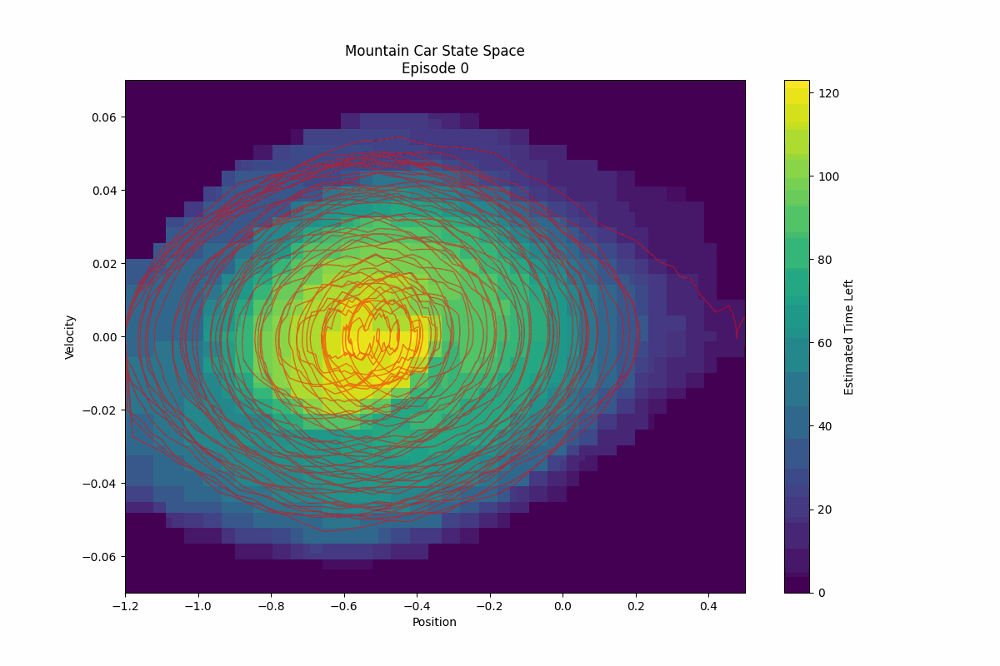

In [4]:
animation = run_animation(num_episodes=500)  # Reduced episodes for faster rendering
display(animation)